In [31]:
import uproot
import matplotlib.pyplot as plt
from plotly import graph_objs as go
import pylab
from biokit import viz
import plotter

In [32]:
fileDS = uproot.open("/mu2e/data/users/oksuzian/sim.oksuzian.DS-resampler-TrkCalCRV.beamds_resampler_beam_g4-10-5.v2.root")
filePS = uproot.open("/mu2e/data/users/oksuzian/sim.oksuzian.PS-resampler-TrkCalCRV.beamps_resampler_beam_g4-10-5.v2.root")

dstree = fileDS["HitDumper"]["nt"]
pstree = filePS["HitDumper"]["nt"]

In [33]:
psdf = pstree.pandas.df(flatten=False)
dsdf = dstree.pandas.df(flatten=False)

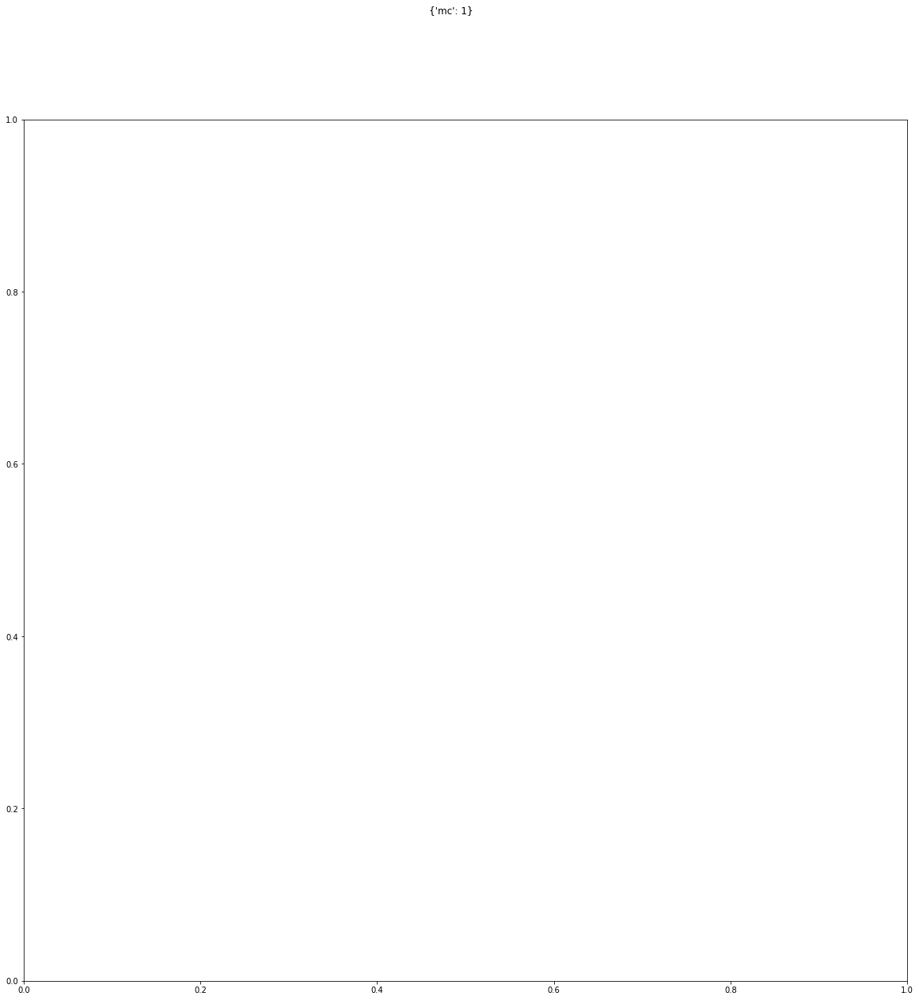

In [34]:
samples = {'mc': psdf}
weights = {'mc': 1}
my_plotter = plotter.Plotter(samples, weights)


In [20]:
cuts = ["hits.time < 500"]
cut = " & ".join(cuts)

In [21]:
fig, ax = my_plotter.plot_variable("deent_mom",
                                   query=cut,
                                   title="Reco. momentum [GeV]",
                                   cat_var="hits.time",
                                   x_range=(95,110),
                                   bins=30)
ax.set_yscale('log')
ax.set_ylim(bottom=0.5, top=1e5)

AttributeError: 'Plotter' object has no attribute 'plot_variable'

In [ ]:
import matplotlib.pyplot as plt
#fig, axes = plt.subplots(2, 1, sharex='col', figsize=(20,10))

#psdf.plot.hist(x='hits.x', y='hits.y', c='DarkBlue', s=0.1, ax=axes[0,1], label='PS source')

psfdcut = psdf.loc[(psdf['hits.time'] <500)]
print(psdf['hits.time'])
#psdf.query('hits.time < hits.time')
#psfdcut.hist(column="hits.time", bins=50000)
#plt.xlim([0,300.0])

#n, bins, patches = axes[0,0].hist(psdf["hits.z"], bins=100, range=(0,20000), label="")
#n, bins, patches = axes[1,0].hist(dsdf["hits.z"], bins=100, range=(0,20000), label="")

In [ ]:
ax1 = psdf.plot.scatter(x='hits.z', y='hits.x', c='DarkBlue', s=0.1)
ax2 = dsdf.plot.scatter(x='hits.z', y='hits.x', c='DarkBlue', s=0.1)
ax3 = psdf.plot.scatter(x='hits.x', y='hits.y', c='DarkBlue', s=0.1)
ax4 = dsdf.plot.scatter(x='hits.x', y='hits.y', c='DarkBlue', s=0.1)

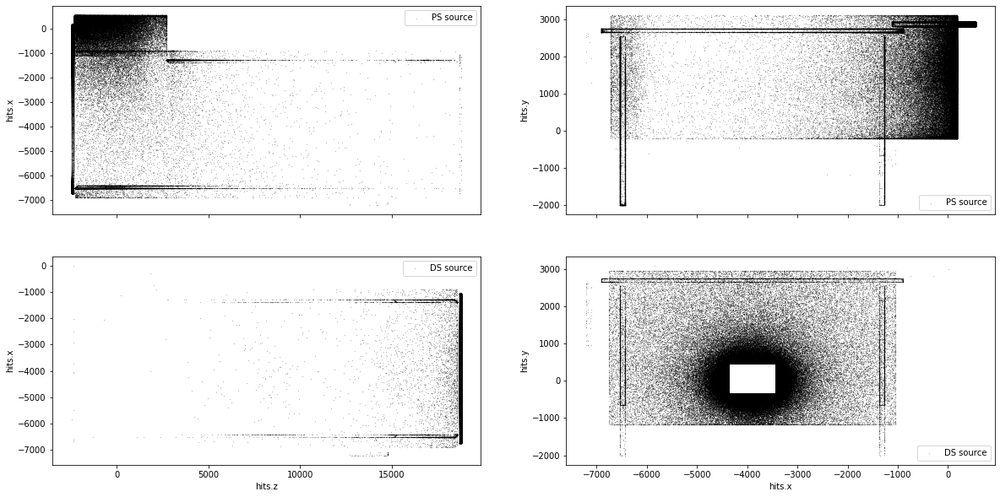

In [40]:
fig, axes = plt.subplots(2, 2, sharex='col',figsize=(20,10))
psdf.plot.scatter(x='hits.z', y='hits.x', c='Black', s=0.01, ax=axes[0,0], label='PS source')
psdf.plot.scatter(x='hits.x', y='hits.y', c='Black', s=0.01, ax=axes[0,1], label='PS source')
dsdf.plot.scatter(x='hits.z', y='hits.x', c='Black', s=0.01, ax=axes[1,0], label='DS source')
dsdf.plot.scatter(x='hits.x', y='hits.y', c='Black', s=0.01, ax=axes[1,1], label='DS source')

In [ ]:
fig, axes = plt.subplots(2, 2, sharex='col',figsize=(20,10))
psdf.plot.scatter(x='hits.z', y='hits.x', c='Black', s=0.01, ax=axes[0,0], label='PS source')
psdf.plot.scatter(x='hits.x', y='hits.y', c='Black', s=0.01, ax=axes[0,1], label='PS source')
dsdf.plot.scatter(x='hits.z', y='hits.x', c='Black', s=0.01, ax=axes[1,0], label='DS source')
dsdf.plot.scatter(x='hits.x', y='hits.y', c='Black', s=0.01, ax=axes[1,1], label='DS source')

In [ ]:
fig, axes = plt.subplots(2, 2,figsize=(20,8))
psdf.plot.scatter(x='hits.InitZ', y='hits.InitX', sharex='col', c='Black', s=0.01, ax=axes[0,0], label='PS source')
psdf.plot.scatter(x='hits.InitX', y='hits.InitY', sharex='col', c='Black', s=0.01, ax=axes[0,1], label='PS source')
dsdf.plot.scatter(x='hits.InitZ', y='hits.InitX', sharex='col', c='Black', s=0.01, ax=axes[1,0], label='DS source')
dsdf.plot.scatter(x='hits.InitX', y='hits.InitY', sharex='col', c='Black', s=0.01, ax=axes[1,1], label='DS source')

In [37]:
#fig, axes = plt.subplots(2, 2, sharex='col',figsize=(20,10))
#psdf.plot.hist2d(x='hits.z', y='hits.x', bins=(100, 100), cmap=plot.cm.jet, ax=axes[0,0], label='PS source')
#plt.hist2d(psdf['hits.z'], psdf['hits.x'], bins=(10, 10), cmap=plt.cm.Reds, label='PS source')
#plt.scatter(psdf['hits.z'], psdf['hits.x'])
#import plotly.express as px
#fig = px.scatter(psdf, x="hits.z", y="hits.x", render_mode='webgl')
#fig.update_traces(marker_line=dict(width=1, color='DarkSlateGray'))

import plotly.graph_objects as go
fig = go.Figure()
fig.add_trace(go.Histogram2d(x=psdf['hits.z'], y=psdf['hits.x'], colorscale='dense', zmax=10, nbinsx=500, nbinsy=500, zauto=False))
#fig.add_trace(go.Scattergl(x=psdf['hits.z'], y=psdf['hits.x'], mode = 'markers', opacity=0.1,
#        marker = dict(line = dict(width = 1, color = 'DarkSlateGrey'))))
fig.show()


In [39]:
from plotly.subplots import make_subplots
fig = make_subplots(rows=1, cols=2)
fig.add_trace(go.Scatter(y=[4, 2, 1], mode="lines"), row=1, col=1)
fig.add_trace(go.Bar(y=[2, 1, 3]), row=1, col=2)
fig.show()

(array([[  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ..., 247., 259., 396.],
        [  0.,   0.,   0., ..., 116., 148., 406.],
        ...,
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.],
        [  0.,   0.,   0., ...,   0.,   0.,   0.]]),
 array([-2.44793506e+03, -2.34187721e+03, -2.23581936e+03, -2.12976151e+03,
        -2.02370366e+03, -1.91764581e+03, -1.81158796e+03, -1.70553011e+03,
        -1.59947227e+03, -1.49341442e+03, -1.38735657e+03, -1.28129872e+03,
        -1.17524087e+03, -1.06918302e+03, -9.63125171e+02, -8.57067322e+02,
        -7.51009473e+02, -6.44951624e+02, -5.38893774e+02, -4.32835925e+02,
        -3.26778076e+02, -2.20720227e+02, -1.14662378e+02, -8.60452881e+00,
         9.74533203e+01,  2.03511169e+02,  3.09569019e+02,  4.15626868e+02,
         5.21684717e+02,  6.27742566e+02,  7.33800415e+02,  8.39858264e+02,
         9.45916113e+02,  1.05197396e+03,  1.15803181e+03,  1.26408966e

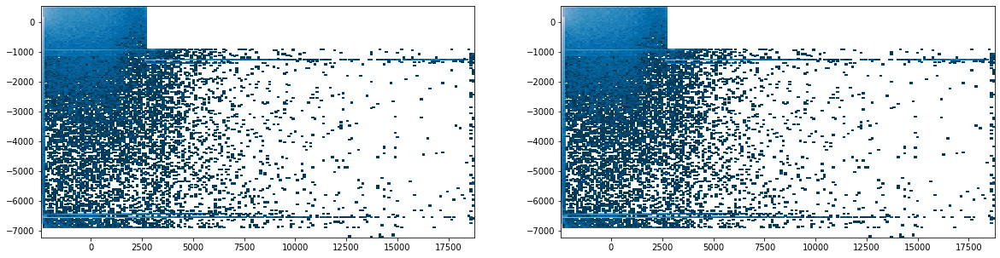

In [74]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
fig, ax = plt.subplots(1, 2, figsize=(20,5))
#pcm = ax[0].pcolor(psdf['hits.z'], psdf['hits.x'])
#ax[0].hist2d(psdf['hits.z'], psdf['hits.x'], bins=(100, 100), cmap=plt.cm.Greys, density=True, norm=mcolors.PowerNorm(0.8))
ax[0].hist2d(psdf['hits.z'], psdf['hits.x'], bins=(200, 200), cmap='PuBu_r', norm = mcolors.LogNorm())
ax[1].hist2d(psdf['hits.z'], psdf['hits.x'], bins=(200, 200), cmap='PuBu_r', norm = mcolors.LogNorm())
